Fichier original 
https://drive.google.com/file/d/1u4S5ILT6fCFk8J3Nkpyom9-pKjETI_u0/view?usp=drive_web

FICHIER AUGMENTE 

In [98]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import librosa
import librosa.display
import IPython.display as ipd
from IPython.display import Audio, display
import librosa.display
from langdetect import detect
import speech_recognition as sr
import langid
import googletrans
import soundfile as sf 
import seaborn as sns

Chargement et lecture du fichier audio 

In [99]:
# Charger le fichier audio
Audio_file, sr = librosa.load("Masque\Msg_f_fr.mp3")

# Afficher l'audio en utilisant le taux d'échantillonnage
display(Audio(data=Audio_file, rate=sr))

Basic information regarding audio files

In [100]:
print(Audio_file.shape)

# duration in seconds of 1 sample
sample_duration = 1 / sr
print(f"One sample lasts for {sample_duration:6f} seconds")


(724475,)
One sample lasts for 0.000045 seconds


Audio caracteristics visualisation 

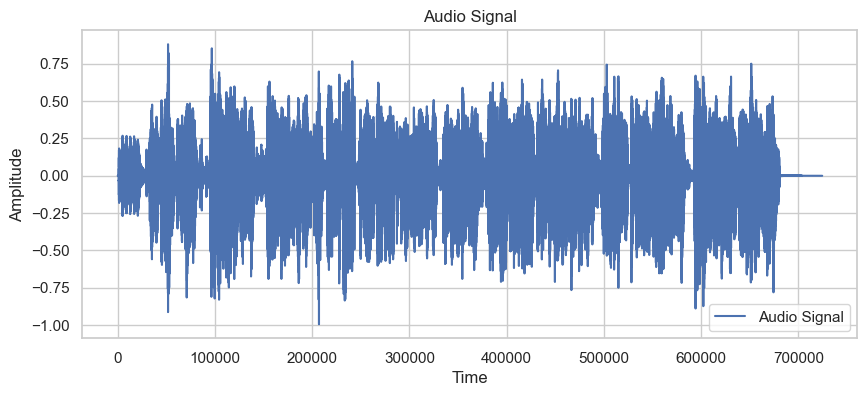

In [101]:
# Créer un graphique de visualisation du signal audio 
plt.figure(figsize=(10, 4))
plt.plot(Audio_file, label='Audio Signal')
plt.title('Audio Signal')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.legend()
plt.show()

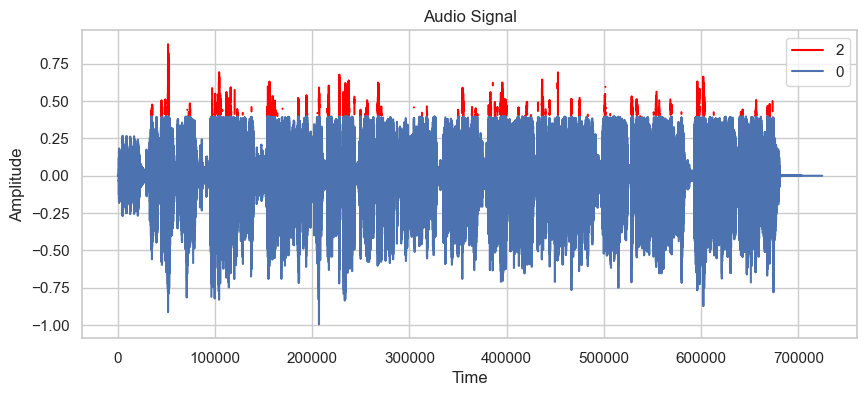

In [102]:
# Créer un graphique pour visualiser le signal audio ainsi que les amplitudes de ce dernier 
plt.figure(figsize=(10, 4))

# Définir la condition pour les amplitudes à colorer en rouge
red_condition = Audio_file > np.percentile(Audio_file, 99.50)  # Les 5% d'amplitudes les plus élevées

# Tracer les points de données en rouge si la condition est vraie
plt.plot(np.where(red_condition, Audio_file, np.nan), color='red', label='High Amplitude')

# Tracer les autres points de données en bleu
plt.plot(np.where(~red_condition, Audio_file, np.nan), label='Normal Amplitude')

plt.title('Audio Signal')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.legend("2020_03_25_000030-ci-covid19-unesco_msg03_eng.wav")
plt.grid(True)

plt.show()

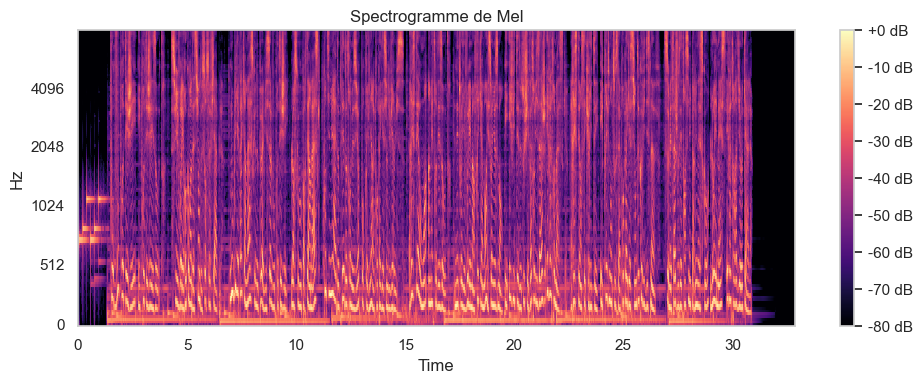

Tempo: 112.34714673913044
Beat frames: [  19   42   66   95  120  142  166  187  210  233  256  279  299  322
  349  374  400  423  445  465  487  511  535  561  585  609  632  656
  681  705  730  755  780  804  828  853  879  903  927  951  975  996
 1019 1041 1064 1088 1112 1134 1159 1181 1202 1226 1249 1272 1293 1316]


In [103]:
# Obtenir le tempo et les beats
tempo, beat_frames = librosa.beat.beat_track(y=Audio_file, sr=sr)

# Obtenir le spectre de Mel
S = librosa.feature.melspectrogram(y=Audio_file, sr=sr, n_mels=128, fmax=8000)

# Visualiser le spectre de Mel
plt.figure(figsize=(10, 4))
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogramme de Mel')
plt.tight_layout()
plt.show()

print(f'Tempo: {tempo}')
print(f'Beat frames: {beat_frames}')

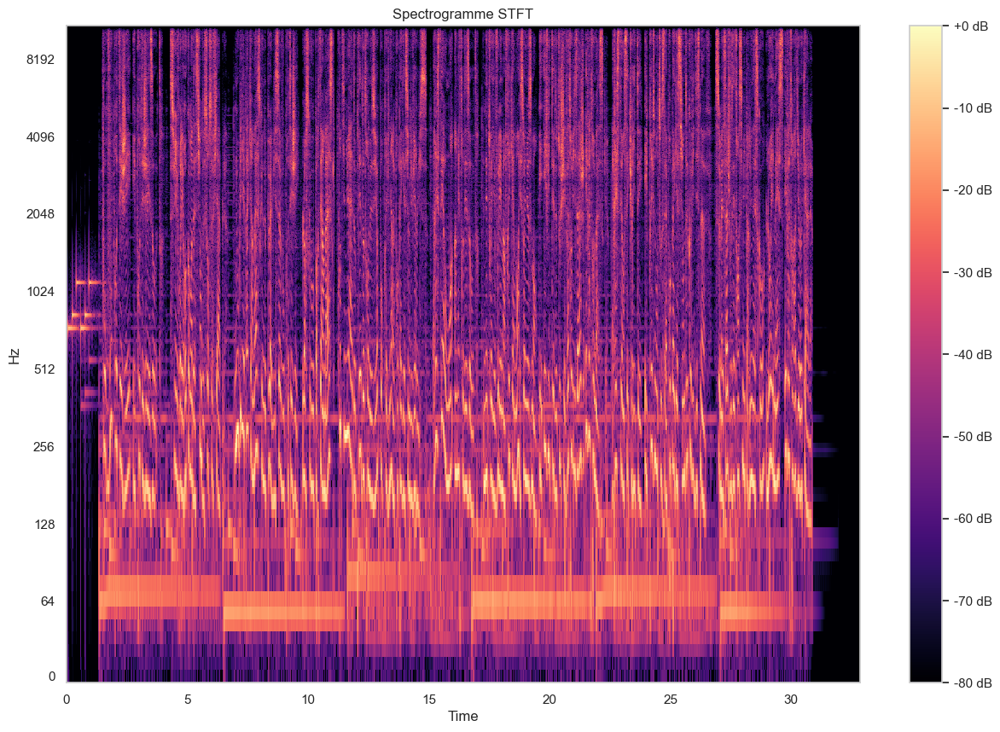

In [104]:
#Effectuer une analyse temps-fréquence d'un signal audio à l'aide de la transformée de Fourier à court terme (STFT) et visualiser le résultat sous forme de spectrogramme.
D = librosa.stft(Audio_file)

# Convertir en amplitude
D_amp = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Visualiser l'analyse temporelle et fréquentielle
plt.figure(figsize=(15, 10))
librosa.display.specshow(D_amp, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogramme STFT')
plt.show()

In [105]:
# Obtenir le ton chromatique
C = librosa.feature.chroma_cqt(y=Audio_file, sr=sr)

# Obtenir le contraste spectral
contrast = librosa.feature.spectral_contrast(S=S, sr=sr)

# Obtenir les statistiques
mean_S = np.mean(S)
std_S = np.std(S)
mean_C = np.mean(C)
std_C = np.std(C)
mean_contrast = np.mean(contrast)
std_contrast = np.std(contrast)

print(f'Standard deviation Mel spectrogram: {std_S}')
print(f'Mean Chroma: {mean_C}')
print(f'Standard deviation Chroma: {std_C}')
print(f'Mean Spectral contrast: {mean_contrast}')
print(f'Standard deviation Spectral contrast: {std_contrast}')

Standard deviation Mel spectrogram: 39.60520553588867
Mean Chroma: 0.3994050920009613
Standard deviation Chroma: 0.279331237077713
Mean Spectral contrast: 20.394472801699468
Standard deviation Spectral contrast: 10.786539921810578


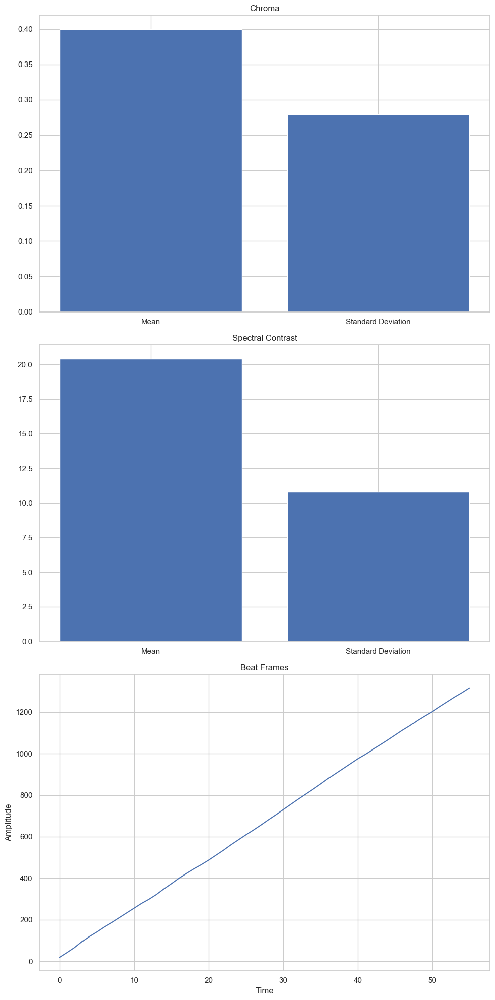

In [106]:
# Créer une figure et des axes
fig, axs = plt.subplots(3, 1, figsize=(10, 20))

# Visualiser le ton chromatique
axs[0].bar(['Mean', 'Standard Deviation'], [mean_C, std_C])
axs[0].set_title('Chroma')

# Visualiser le contraste spectral
axs[1].bar(['Mean', 'Standard Deviation'], [mean_contrast, std_contrast])
axs[1].set_title('Spectral Contrast')

# Visualiser les beats
axs[2].plot(beat_frames)
axs[2].set_title('Beat Frames')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Amplitude')

# Afficher la figure
plt.tight_layout()
plt.show()

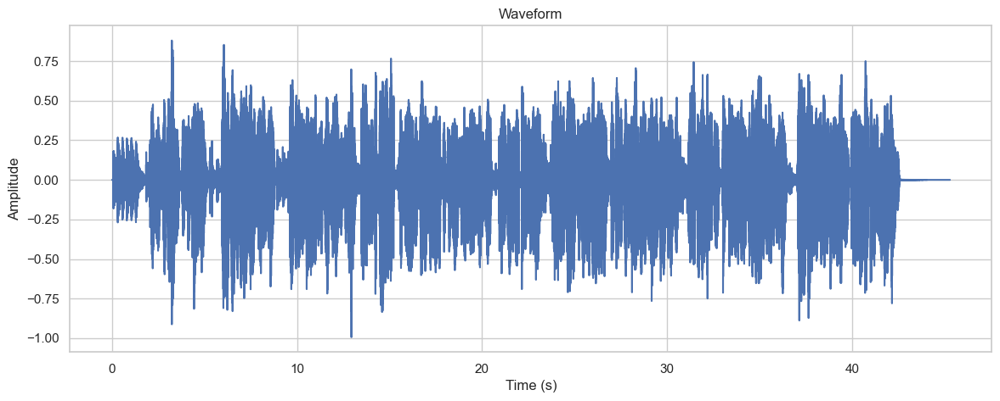

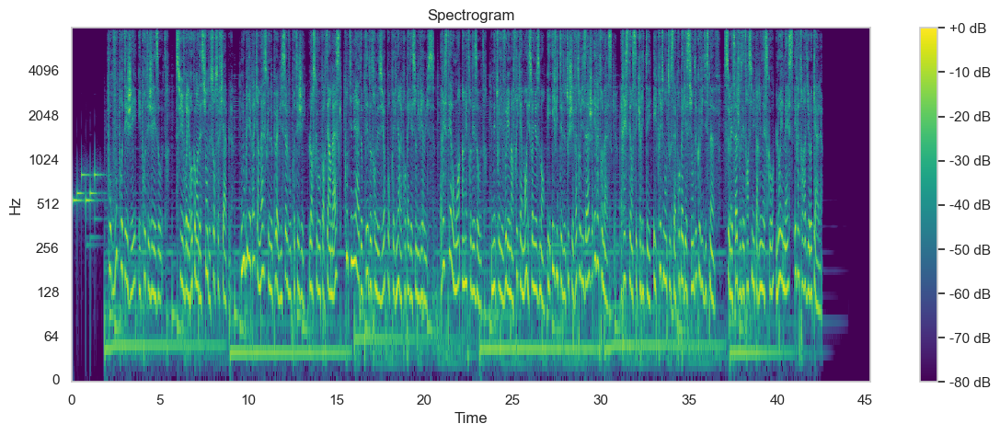

c:\Users\Bryan\anaconda3\Lib\site-packages\matplotlib\cbook\__init__.py:1340: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


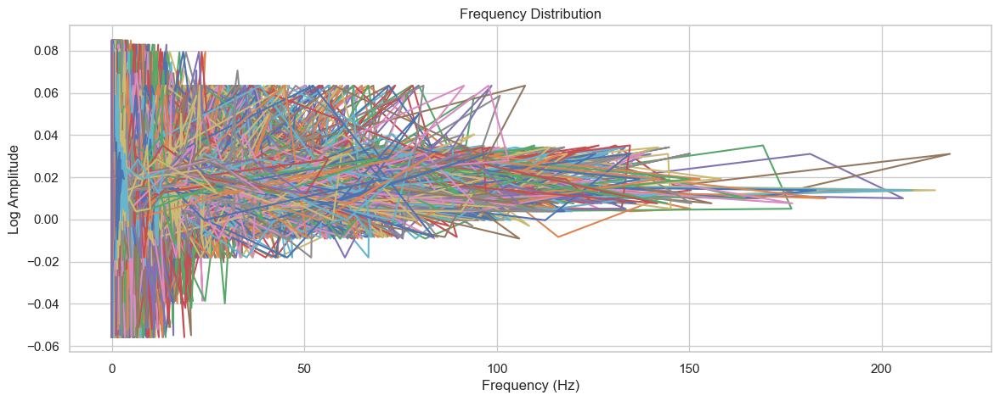

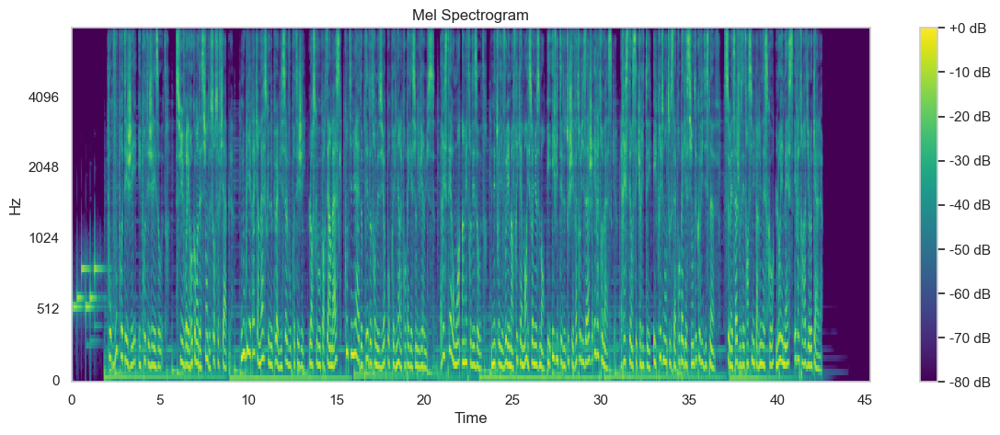

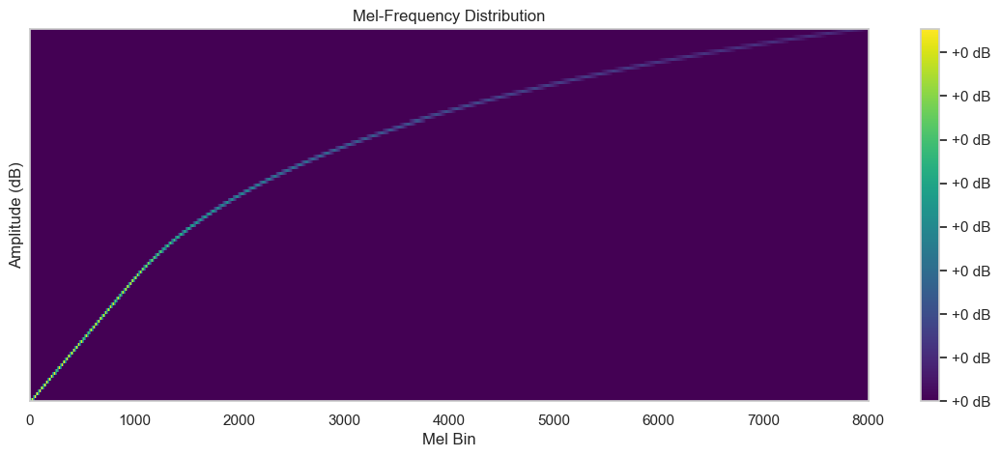

In [107]:
# Set Seaborn style
sns.set(style="whitegrid")

# Function to visualize the waveform using Seaborn and Matplotlib
def visualize_waveform(data, sr=16000, title="Waveform"):
    plt.figure(figsize=(14, 5))
    sns.lineplot(x=np.arange(len(data)) / sr, y=data)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()

# Function to visualize the spectrogram using Seaborn and Matplotlib
def visualize_spectrogram(data, sr=16000, title="Spectrogram"):
    plt.figure(figsize=(14, 5))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(data)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.show()

# Function to visualize the frequency distribution using Seaborn and Matplotlib
def visualize_frequency_distribution(data, sr=16000, title="Frequency Distribution"):
    plt.figure(figsize=(14, 5))
    frequencies, amplitudes = librosa.magphase(librosa.stft(data))
    plt.plot(frequencies, np.log1p(amplitudes.mean(axis=1)))  # Use mean(axis=1) to collapse the second dimension
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Log Amplitude')
    plt.show()



# Function to visualize the Mel Spectrogram using Seaborn and Matplotlib
def visualize_melspectrogram(data, sr=16000, title="Mel Spectrogram"):
    plt.figure(figsize=(14, 5))
    mel_spec = librosa.feature.melspectrogram(y=data, sr=sr)  # Pass the audio data as 'y'
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    librosa.display.specshow(mel_spec_db, sr=sr, x_axis='time', y_axis='mel', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.show()

# Function to visualize the Mel-Frequency Distribution using Seaborn and Matplotlib
def visualize_melfrequency(data, sr=16000, title="Mel-Frequency Distribution"):
    plt.figure(figsize=(14, 5))
    mel_filters = librosa.filters.mel(sr=sr, n_fft=2048, n_mels=128, fmin=0.0, fmax=None, htk=False)
    librosa.display.specshow(mel_filters, sr=sr, x_axis='linear', cmap='viridis')
    plt.title(title)
    plt.xlabel('Mel Bin')
    plt.ylabel('Amplitude (dB)')
    plt.colorbar(format='%+2.0f dB')
    plt.show()



# Example usage:

# Load your audio file or use a random signal as an example
# Example: audio_data, sr = librosa.load('your_audio_file.wav', sr=16000)
# Make sure to load the audio file with the correct sample rate (sr)
audio_data=Audio_file

# Visualize waveform using Seaborn
visualize_waveform(audio_data, sr=16000, title="Waveform")

# Visualize spectrogram using Seaborn
visualize_spectrogram(audio_data, sr=16000, title="Spectrogram")
# Visualize frequency distribution using Seaborn
visualize_frequency_distribution(audio_data, sr=16000, title="Frequency Distribution")
# Visualize Mel Spectrogram using Seaborn
visualize_melspectrogram(audio_data, sr=16000, title="Mel Spectrogram")

# Visualize Mel-Frequency Distribution using Seaborn
visualize_melfrequency(audio_data, sr=16000, title="Mel-Frequency Distribution")


In [108]:
# Créer un DataFrame avec les mesures calculées
df = pd.DataFrame({
    'Tempo': [tempo],
    'Mean Mel spectrogram': [mean_S],
    'Standard deviation Mel spectrogram': [std_S],
    'Mean Chroma': [mean_C],
    'Standard deviation Chroma': [std_C],
    'Mean Spectral contrast': [mean_contrast],
    'Standard deviation Spectral contrast': [std_contrast]
})

# Ajouter des colonnes pour le sexe et la langue
df['Sexe'] = [''] 
df['Langue'] = ['']  

print(df)

        Tempo  Mean Mel spectrogram  Standard deviation Mel spectrogram  \
0  112.347147              4.806532                           39.605206   

   Mean Chroma  Standard deviation Chroma  Mean Spectral contrast  \
0     0.399405                   0.279331               20.394473   

   Standard deviation Spectral contrast Sexe Langue  
0                              10.78654              


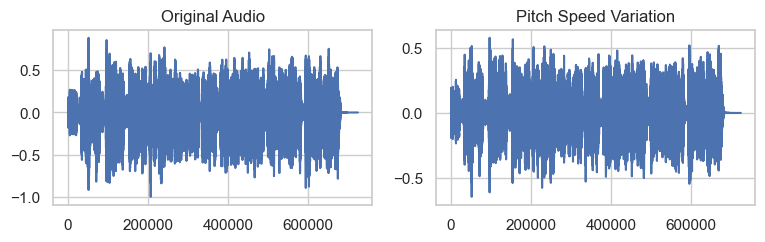

In [109]:
# Fonction d'application du pitch speed variation
def pitch_speed_variation(data, speed_factor):
    return librosa.effects.pitch_shift(data, sr=16000, n_steps=speed_factor)

pitch_speed_data = pitch_speed_variation(Audio_file, 2.5)  

# Plot and play the original and augmented signals
plt.figure(figsize=(14, 5))
plt.subplot(2, 3, 1)
plt.plot(Audio_file)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(pitch_speed_data)
plt.title('Pitch Speed Variation')

plt.show()

ipd.Audio(pitch_speed_data, rate=sr)

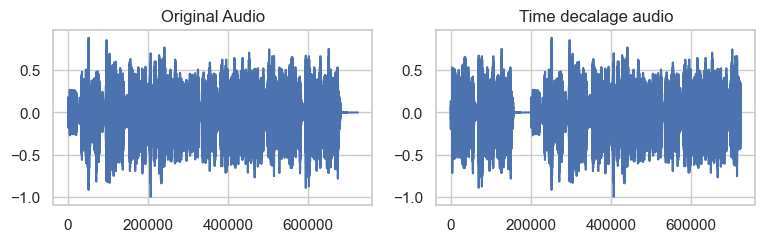

In [110]:
#Effectuation d'un décalage temporel : faire commencer l'enregistrement à une autre période 
augmented_audio = np.roll(Audio_file, 200000 )

plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_file)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(augmented_audio)
plt.title('Time decalage audio')

plt.show()

ipd.Audio(augmented_audio, rate=sr)

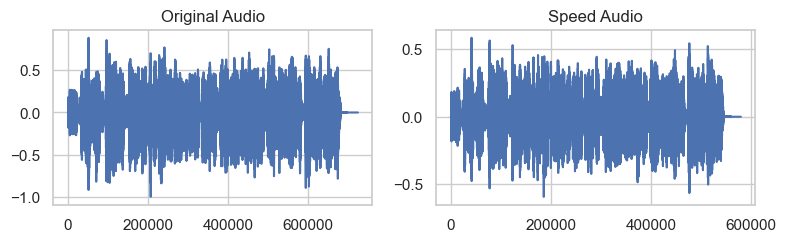

In [111]:
#Changement de vitesse 
rate = 1.25
speed_audio = librosa.effects.time_stretch(Audio_file, rate = rate)
plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_file)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(speed_audio)
plt.title('Speed Audio')

plt.show()

display(Audio(data=speed_audio, rate=sr))


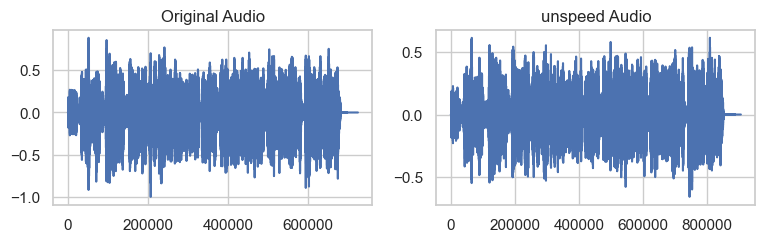

In [112]:
#Changement de vitesse déccéléré 
rate = 0.8
unspeed_audio = librosa.effects.time_stretch(Audio_file, rate = rate)
plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_file)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(unspeed_audio)
plt.title('unspeed Audio')

plt.show()

ipd.Audio(unspeed_audio, rate=sr)


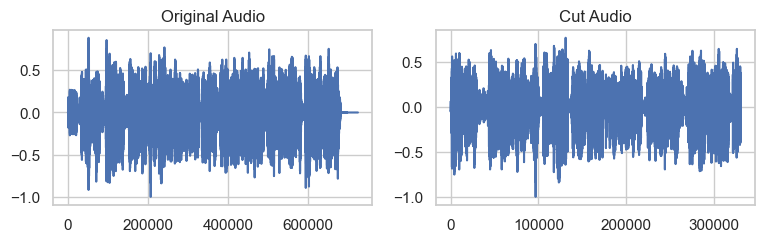

In [113]:
#Couper une partie d'un enregistrement 
debut = 5.0
fin = 20.0
signal_coupe = Audio_file[int(debut * sr):int(fin * sr)]


plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_file)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(signal_coupe)
plt.title('Cut Audio')

plt.show()

ipd.Audio(signal_coupe, rate=sr)


In [124]:
# Charger les deux enregistrements audio
audio_deux, sr2 = librosa.load("Masque\Msg_h_ang.mp3")

# Vérifier que les fréquences d'échantillonnage sont identiques
if sr != sr2:
    raise ValueError("Les fréquences d'échantillonnage des deux fichiers audio doivent être identiques.")

# Définir le point d'insertion (en secondes)
point_insertion = 2.0


# Créer un nouveau signal en concaténant les deux
signal_concatene = np.concatenate((audio_deux, Audio_file[int(point_insertion * sr2):]))


ipd.Audio(signal_concatene, rate=sr)